# 3D CNN with pretrained Model

## Read the Data

In [ ]:
from IPython.display import clear_output

# Guys, put the kaggle.json File in your drive before running this code here.
import os
os.environ["KAGGLE_CONFIG_DIR"] = '/content'

In [ ]:
!kaggle datasets download -d toluwaniaremu/smartcity-cctv-violence-detection-dataset-scvd

 99% 950M/960M [00:09<00:00, 103MB/s] 
100% 960M/960M [00:09<00:00, 106MB/s]


In [ ]:
! mkdir kaggle_data
! unzip {"smartcity-cctv-violence-detection-dataset-scvd" + ".zip"} -d kaggle_data
clear_output()

## importing Libararies

In [ ]:
!pip install pytorchvideo
clear_output()

In [ ]:
!pip install pytorch_lightning
clear_output()


In [ ]:
# Package imports



import os
import shutil
import pandas as pd
from glob import glob
from IPython.display import HTML
from base64 import b64encode


import numpy as np
import pandas as pd
import sklearn
from sklearn.metrics import confusion_matrix, classification_report , accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.image import imread

import torch
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset, ConcatDataset, random_split
import torch.nn as nn
import torchvision.models as models
from torchvision.utils import make_grid
import torch.nn.functional as F

from mlxtend.plotting import plot_confusion_matrix

from pytorchvideo.data import make_clip_sampler, labeled_video_dataset

from pytorchvideo.transforms import(
    ApplyTransformToKey,
    Normalize,
    RandomShortSideScale,
    UniformTemporalSubsample,
    Permute
)
from torchvision.transforms import (
    Compose,
    Lambda,
    RandomCrop,
    RandomHorizontalFlip,
    RandomVerticalFlip,
    Resize
)

from torchvision.transforms._transforms_video import (
    CenterCropVideo,
    NormalizeVideo
)

from torch.optim.lr_scheduler import CosineAnnealingLR
from pytorch_lightning import  seed_everything , Trainer , LightningDataModule,LightningModule

from pytorch_lightning.callbacks import ModelCheckpoint , LearningRateMonitor
import torchmetrics
from torchmetrics.classification import MulticlassAccuracy
from torch.utils.data.distributed import T_co

import seaborn as sns


%matplotlib inline

In [ ]:
ls = !ls {'/content/kaggle_data/SCVD/videos'}
ls

["'Non-Violence Videos'  'violence video cleaned'  'Weapon Violence'"]

In [ ]:
CLASSES = ['Non-Violence Videos', 'violence video cleaned', 'Weapon Violence']
CLASSES[0]

'Non-Violence Videos'

## View a sample

In [ ]:

def play(filename):
    html = ''
    video = open(filename,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    return HTML(html)

In [ ]:
play('/content/kaggle_data/SCVD/videos/Weapon Violence/WV1.mp4')

# Data Prepration

In [ ]:

file_path = '/content/kaggle_data/SCVD/videos/'

Non_Violence = glob(file_path + 'Non-Violence Videos/*') # class 0
Weapon_Violence = glob(file_path + 'Weapon Violence/*') # class 1
Normal_Violence = glob(file_path + 'violence video cleaned/*') # class 2
label=[0]*len(Non_Violence) + [1]*len(Weapon_Violence) + [2]*len(Normal_Violence)
df=pd.DataFrame(zip(Non_Violence + Normal_Violence + Weapon_Violence,label), columns = ['file','label'])

In [ ]:
df

,file,label
0,/content/kaggle_data/SCVD/videos/Non-Violence ...,0
1,/content/kaggle_data/SCVD/videos/Non-Violence ...,0
2,/content/kaggle_data/SCVD/videos/Non-Violence ...,0
3,/content/kaggle_data/SCVD/videos/Non-Violence ...,0
4,/content/kaggle_data/SCVD/videos/Non-Violence ...,0
...,...,...
477,/content/kaggle_data/SCVD/videos/Weapon Violen...,2
478,/content/kaggle_data/SCVD/videos/Weapon Violen...,2
479,/content/kaggle_data/SCVD/videos/Weapon Violen...,2
480,/content/kaggle_data/SCVD/videos/Weapon Violen...,2


In [ ]:
# 70% - 15% - 15%
train_df, val_df = train_test_split(df, test_size=0.30, shuffle=True, stratify=df['label'], random_state=42)
val_df, test_df = train_test_split(val_df, test_size=0.50, shuffle=True, stratify=val_df['label'], random_state=42)


# Define the base directory for the train folder

# Base directories for train, validation, and test folders
base_dirs = {
    "train": "/content/dataset/train",
    "validation": "/content/dataset/validation",
    "test": "/content/dataset/test"
}

# Define subfolders based on label names
subfolders = {
    0: "Non-Violence Videos",
    1: "Weapon Violence",
    2: "Violence Video Cleaned"
}

# Function to create directories and move files
def move_files(df, base_dir):

    os.makedirs(base_dir, exist_ok=True)
    for subfolder in subfolders.values():
        os.makedirs(os.path.join(base_dir, subfolder), exist_ok=True)

    for index, row in df.iterrows():
        file_path = row['file']
        label = row['label']
        subfolder_name = subfolders[label]
        destination_folder = os.path.join(base_dir, subfolder_name)

        shutil.move(file_path, os.path.join(destination_folder, os.path.basename(file_path)))

# Move files for each dataset
for dataset_type, df in zip(["train", "validation", "test"], [train_df, val_df, test_df]):
    move_files(df, base_dirs[dataset_type])

print("Files for train, validation, and test datasets moved successfully.")


Files for train, validation, and test datasets moved successfully.


### Data Augmentation

In [ ]:

video_transforms = Compose([
    ApplyTransformToKey(key= 'video', # we will have so many keys to apply the transforms to, we are interested in video key only.
    transform = Compose([
     UniformTemporalSubsample(20), # number of frames per a sec
     Lambda(lambda x: x / 255),
     Normalize((0.45, 0.45, 0.45), (0.225, 0.225, 0.225)),
     RandomShortSideScale(min_size=400, max_size=720), # max height I found was 720
     CenterCropVideo(224),
     RandomHorizontalFlip(p = 0.5),
     RandomVerticalFlip(p=0.5)
    ]),
  ),
])

In [ ]:
train_dataset_labeled = labeled_video_dataset(
    "/content/dataset/train/",
    clip_sampler=make_clip_sampler('uniform', 2),
    transform=video_transforms,
    decode_audio=False
)


Check the output

In [ ]:
train_loader = DataLoader(train_dataset_labeled, batch_size=2, num_workers= 0, pin_memory = True)

batch = iter(train_loader)
batch = next(iter(train_loader))

batch, batch['video'], batch['label']

({'video': tensor([[[[[-1.2859e-02, -1.3072e-02, -1.3072e-02,  ..., -1.1031e+00,
              -1.1387e+00, -1.1737e+00],
             [-1.3072e-02, -1.3072e-02, -1.3072e-02,  ..., -1.0740e+00,
              -1.1289e+00, -1.1560e+00],
             [-4.9207e-02, -5.1893e-02, -7.6435e-02,  ..., -1.0525e+00,
              -1.1287e+00, -1.1456e+00],
             ...,
             [ 2.0273e+00,  1.9901e+00,  1.9780e+00,  ..., -4.2747e-01,
              -7.5647e-01, -9.9402e-01],
             [ 2.0111e+00,  1.9905e+00,  1.9817e+00,  ..., -4.7966e-01,
              -8.2004e-01, -1.0329e+00],
             [ 1.9786e+00,  1.9810e+00,  1.9739e+00,  ..., -5.9568e-01,
              -9.3518e-01, -1.0194e+00]],
  
            [[-7.3898e-02, -2.0202e-02,  7.5812e-02,  ..., -1.0572e+00,
              -1.1288e+00, -1.1493e+00],
             [-8.2565e-02, -4.1254e-02,  3.6827e-02,  ..., -1.0066e+00,
              -1.1185e+00, -1.1311e+00],
             [-5.8399e-02, -3.1800e-02,  2.3644e-02,  ..., -9.769

# Building the model


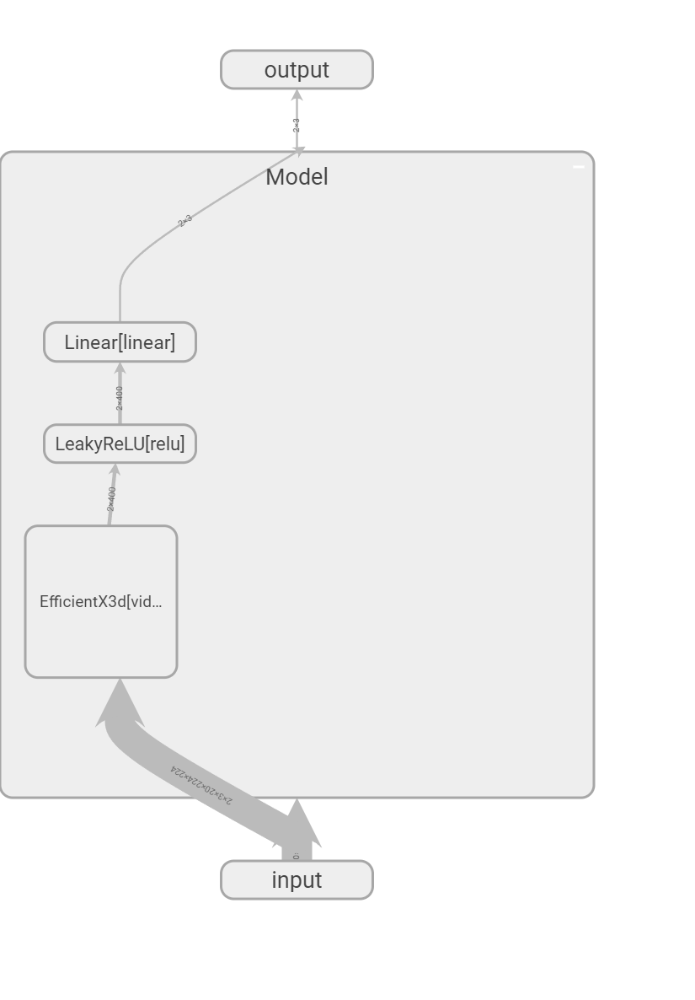

In [ ]:
class Model(LightningModule):
    def __init__(self):
        super(Model, self).__init__()
        self.video_model = torch.hub.load('facebookresearch/pytorchvideo', 'efficient_x3d_xs', pretrained=True)
        self.relu = nn.LeakyReLU(0.05)
        self.linear = nn.Linear(400, 3) # takes 440 then Output 3 classes

        # self.softmax = nn.Softmax(dim=1) This will be computed during loss nn.CrossEntropyLoss
        #hyperparamter for the model and the processer

        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.testing_step_outputs = []
        self.lr = 1e-3 # best found
        self.batch_size = 8
        self.number_worker = 4

        # # evaluation metric
        # self.metric = MulticlassAccuracy(3)

        # loss function
        self.criterion = nn.CrossEntropyLoss()

    def forward(self,x):
      x = self.video_model(x)
      x = self.relu(x)
      x = self.linear(x)
      return x

    def configure_optimizers(self):
      opt = torch.optim.Adam(params= self.parameters(), lr= self.lr) # here we will test diffrent optimizers,
      scheduler = CosineAnnealingLR( opt , T_max=10, eta_min = 1e-6, last_epoch =-1 ) # we used cosine as scheduler
      return {'optimizer':opt ,'lr_scheduler': scheduler }


    def train_dataloader(self):
      train_dataset_labeled = labeled_video_dataset(
          "/content/dataset/train/",
          clip_sampler=make_clip_sampler('random', 2),
          transform=video_transforms,
          decode_audio=False
      )
      train_loader = DataLoader(train_dataset_labeled, batch_size=self.batch_size, num_workers= self.number_worker, pin_memory = True)
      return train_loader

    def training_step(self, batch, batch_idx):
      video, label = batch['video'], batch["label"]
      label = label.reshape(-1)
      output = self.forward(video)  # Raw logits from the model
      loss = self.criterion(output, label)
      self.training_step_outputs.append(loss.detach())
      return loss
      # metric=self.metric(output, label.to(torch.float64))
      # return {'loss':loss,
      #         'metric':metric.detach()}


    def on_train_epoch_end(self):
        loss = torch.stack([x for x in  self.training_step_outputs]).mean().cpu().numpy().round(2)
        self.training_step_outputs.clear()
        self.log('train_loss', loss)
        #self.log('train_metric', metric)
        print('training loss ', self.current_epoch, loss)

    def val_dataloader(self):
        train_dataset_labeled = labeled_video_dataset(
                  "/content/dataset/validation/",
                  clip_sampler=make_clip_sampler('random', 2), # will change to uniform
                  transform=video_transforms,
                  decode_audio=False
              )
        loader = DataLoader(train_dataset_labeled, batch_size=self.batch_size, num_workers= self.number_worker, pin_memory = True)

        return loader


    def validation_step(self,batch,batch_idx):
        video, label = batch['video'], batch["label"]
        label = label.reshape(-1)
        output = self.forward(video)  # Raw logits from the model
        loss = self.criterion(output, label)
        self.validation_step_outputs.append(loss)

        # metric=self.metric(output, label.to(torch.float64))
        # return {'loss':loss,
        #         'metric':metric.detach()}


    def on_validation_epoch_end(self):
        loss = torch.stack([x for x in self.validation_step_outputs]).mean().cpu().numpy().round(2)
        self.validation_step_outputs.clear()

        self.log('val_loss', loss)
        #self.log('val_metric', metric)
        print('validation loss', loss)

    def test_dataloader(self):
        train_dataset_labeled = labeled_video_dataset(
                  "/content/dataset/test/",
                  clip_sampler=make_clip_sampler('uniform', 2), # will change to uniform
                  transform=video_transforms,
                  decode_audio=False
              )
        loader = DataLoader(train_dataset_labeled, batch_size=self.batch_size, num_workers= self.number_worker, pin_memory = True)
        return loader


    def test_step(self, batch, batch_idx):
        video, label = batch['video'], batch['label']
        logits = self.forward(video)  # Get raw logits from the model
        self.testing_step_outputs.append({'label': label.detach(), 'pred': logits.detach()})

    def on_test_epoch_end(self):
        label = torch.cat([x['label'] for x in self.testing_step_outputs]).cpu()
        logits = torch.cat([x['pred'] for x in self.testing_step_outputs]).cpu()

        self.testing_step_outputs.clear()
        # Convert logits to predicted classes
        _, pred = torch.max(logits, dim=1)
        # Convert to numpy for classification report
        label_np = label.numpy()
        pred_np = pred.numpy()
        print(pred_np)

        print(classification_report(label_np, pred_np))


In [ ]:

checkpoint_callback = ModelCheckpoint(monitor='val_loss',dirpath='checkpoints',
                                      filename='file',
                                      save_last=True # used to save last value if there is no enhancement
                                      )
lr_monitor = LearningRateMonitor(logging_interval='epoch')

In [ ]:
model = Model()
seed_everything(0)
trainer = Trainer(
    accelerator="auto", devices="auto",
    enable_progress_bar = True,
    callbacks=[lr_monitor,checkpoint_callback],
    # Stop after 35 mins  of training or when reaching 13 epochs
    max_time="00:00:30:00", max_epochs=13,
)
# visualize the model archetitcture

Downloading: "https://github.com/facebookresearch/pytorchvideo/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://dl.fbaipublicfiles.com/pytorchvideo/model_zoo/kinetics/efficient_x3d_xs_original_form.pyth" to /root/.cache/torch/hub/checkpoints/efficient_x3d_xs_original_form.pyth
100%|██████████| 14.8M/14.8M [00:00<00:00, 24.6MB/s]
INFO:lightning_fabric.utilities.seed:Seed set to 0
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
%%time
trainer.fit(model)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type             | Params
-------------------------------------------------
0 | video_model | EfficientX3d     | 3.8 M 
1 | relu        | LeakyReLU        | 0     
2 | linear      | Linear           | 1.2 K 
3 | criterion   | CrossEntropyLoss | 0     
-------------------------------------------------
3.8 M     Trainable params
0         Non-trainable params
3.8 M     Total params
15.182    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

validation loss 1.18


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 0.97
training loss  0 1.16


ERROR:libav.libdav1d:Error parsing OBU data


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 1.67
training loss  1 0.92


ERROR:libav.libdav1d:Error parsing OBU data


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 1.14
training loss  2 0.88


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 0.91
training loss  3 0.71


ERROR:libav.libdav1d:Error parsing OBU data


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 0.97
training loss  4 0.63


ERROR:libav.libdav1d:Error parsing OBU data


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 1.26
training loss  5 0.58


ERROR:libav.libdav1d:Error parsing OBU data


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 1.29
training loss  6 0.43


ERROR:libav.libdav1d:Error parsing OBU data


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 1.07
training loss  7 0.4


ERROR:libav.libdav1d:Error parsing OBU data


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 0.91
training loss  8 0.37


ERROR:libav.libdav1d:Error parsing OBU data


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 0.75
training loss  9 0.28


ERROR:libav.libdav1d:Error parsing OBU data


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 0.99
training loss  10 0.35


ERROR:libav.libdav1d:Error parsing OBU data
INFO:pytorch_lightning.utilities.rank_zero:Time limit reached. Elapsed time is 0:30:04. Signaling Trainer to stop.


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 1.0
training loss  11 0.29
CPU times: user 1min 49s, sys: 1min 32s, total: 3min 22s
Wall time: 31min 40s


In [ ]:
model = Model.load_from_checkpoint("/content/checkpoints/file.ckpt")
val_res=trainer.validate(model)


Using cache found in /root/.cache/torch/hub/facebookresearch_pytorchvideo_main
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

validation loss 1.06


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │     1.059999942779541     │
└───────────────────────────┴───────────────────────────┘

### showing losses through tensorboard

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=lightning_logs/

<IPython.core.display.Javascript object>

In [ ]:
trainer.test(model)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[1 2 1 1 1 2 2 2 2 0 1 2 1 1 0 0 0 0 1 2 2 2 1 1 0 1 2 1 1 2 2 1 2 2 1 1 1
 2 1 2 0 0 1 2 2 2 2 1 0 1 0 2 2 2 2 2 2 2 1 2 2 0 0 2 2 2 2 2 0 0 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 0 2 0 1 2 2 1 1 1 1 2 2 2 0 0 2 2 2 2 2 1 2 0 0 2
 1 1 1 1 1 1 1 2 2 0 0 0 0 1 1 1 0 1 1 1 1 2 2 2 1 1 1 2 2 2 2 2 2 0 0 0 1
 2 2 2]
              precision    recall  f1-score   support

           0       0.57      0.80      0.67        20
           1       0.50      0.48      0.49        48
           2       0.71      0.66      0.69        83

    accuracy                           0.62       151
   macro avg       0.60      0.65      0.61       151
weighted avg       0.63      0.62      0.62       151



[{}]

In [ ]:
from torch.utils.tensorboard import SummaryWriter

# default `log_dir` is "runs" - we'll be more specific here
writer = SummaryWriter('lightning_logs/')
model.to('cuda')
writer.add_graph(model, batch['video'].to('cuda'))

# close the writer when you're done using it
writer.close()


In [ ]:
%tensorboard --logdir=lightning_logs/

Reusing TensorBoard on port 6006 (pid 35581), started 0:01:42 ago. (Use '!kill 35581' to kill it.)

<IPython.core.display.Javascript object>

### Tensorflow losses outputs
in case the tensrflow is not shown to you,

Train and validation Losses:


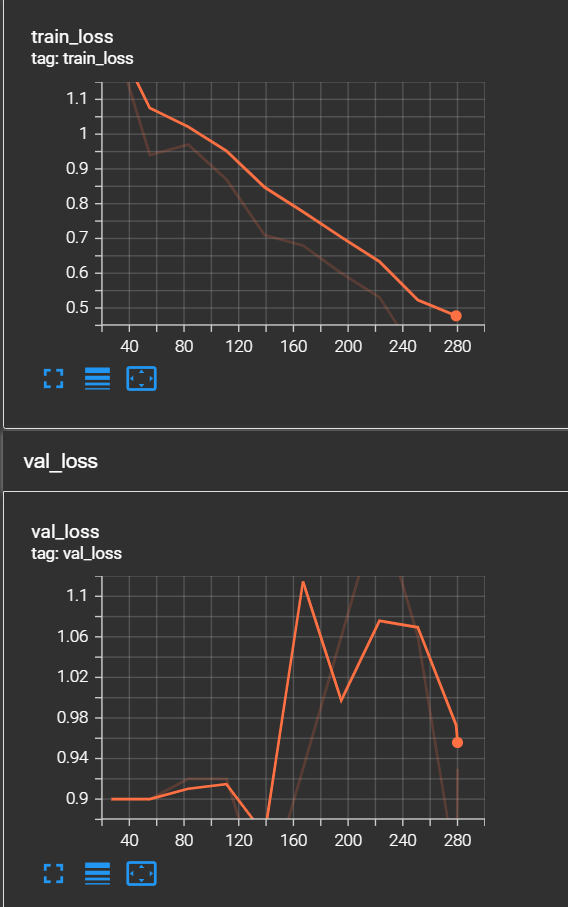

# Real life examples of the model


## Show a sample and how the model classifes a video

In [ ]:
from moviepy.editor import VideoFileClip

predictions = []

def predict_and_display(model, batch):

    with torch.no_grad():
        logits = model(batch['video'].to('cuda'))
        probabilities = F.softmax(logits, dim=1)
        predicted_class = torch.argmax(probabilities, dim=1).item()

    print(f"Predicted Class: {CLASSES[predicted_class]}")
    predictions.append(predicted_class)


test_dataset_labeled = labeled_video_dataset(
    "/content/dataset/test/",
    clip_sampler=make_clip_sampler('uniform', 2),
    transform=video_transforms,
    decode_audio=False
)
CLASSES = ['Non-Violence Videos', 'Violence Video Cleaned',  'Weapon Violence']
test_loader = DataLoader(test_dataset_labeled, batch_size=1, num_workers= 0, pin_memory = True)

batch = iter(test_loader)
batch = next(iter(test_loader))

video_class = CLASSES[batch['label'][0]]
video_name = batch['video_name'][0]
path = f'/content/dataset/test/{video_class}/{video_name}'
duration_of_video = VideoFileClip(path).duration
model = Model.load_from_checkpoint("/content/checkpoints/file.ckpt")

for i in range(int(duration_of_video)):
    batch = next(iter(test_loader))
    print(f"second {i + 1} classifcation: ", end=' ')
    predict_and_display(model, batch)

if (predictions.count(1)):
  print("the model predicts potential Violence in the Video")
if (predictions.count(2)):
  print("the model predicts potential Violence with Weapon in the Video")
print("Real (actual) video class is: ", video_class)
print("Path of the video", path)

play(path)

Using cache found in /root/.cache/torch/hub/facebookresearch_pytorchvideo_main


second 1 classifcation:  Predicted Class: Violence Video Cleaned
second 2 classifcation:  Predicted Class: Violence Video Cleaned
second 3 classifcation:  Predicted Class: Weapon Violence
second 4 classifcation:  Predicted Class: Violence Video Cleaned
second 5 classifcation:  Predicted Class: Violence Video Cleaned
second 6 classifcation:  Predicted Class: Weapon Violence
second 7 classifcation:  Predicted Class: Violence Video Cleaned
second 8 classifcation:  Predicted Class: Violence Video Cleaned
second 9 classifcation:  Predicted Class: Weapon Violence
the model predicts potential Violence in the Video
the model predicts potential Violence with Weapon in the Video
Real (actual) video class is:  Weapon Violence
Path of the video /content/dataset/test/Weapon Violence/V26.mp4


## Show each second of a Video with its classifcation
In this part you can set a video path yourself instead of using a file path chosen from the dataloader.


Using cache found in /root/.cache/torch/hub/facebookresearch_pytorchvideo_main


prediction for this  Weapon Violence


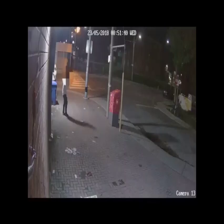

prediction for this  Weapon Violence


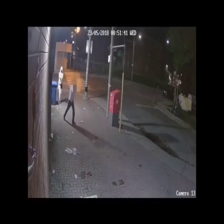

prediction for this  Weapon Violence


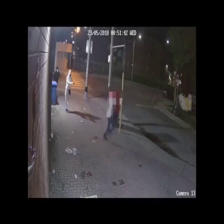

prediction for this  Weapon Violence


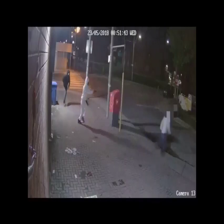

prediction for this  Weapon Violence


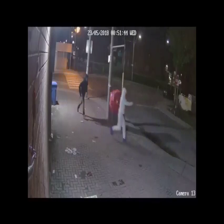

prediction for this  Weapon Violence


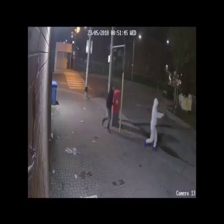

prediction for this  Weapon Violence


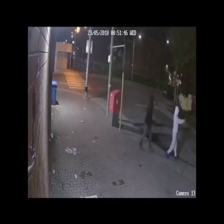

prediction for this  Weapon Violence


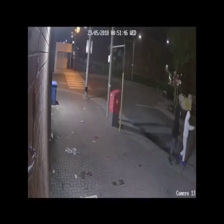

prediction for this  Weapon Violence


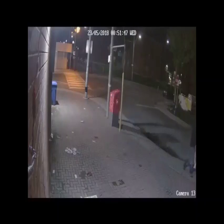

In [ ]:
from moviepy.editor import VideoFileClip
import torch
from torchvision import transforms
from IPython.display import display, clear_output
from PIL import Image

# Define the necessary transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224, 224)),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
model = Model.load_from_checkpoint("/content/checkpoints/file.ckpt")
model.to('cuda')
model.eval()
# Load the video
video_path = '/content/dataset/test/Violence Video Cleaned/WV117.mp4'
clip = VideoFileClip(video_path)
fps = clip.fps  # Frame rate of the video
# Process frames in one-second intervals
for t in range(int(clip.duration)):
    frames = []
    for frame in clip.iter_frames(fps=fps):
        if len(frames) < 20:
            frame_pil = Image.fromarray(frame)
            frame_tensor = transform(frame_pil)
            frames.append(frame_tensor)
        if len(frames) == 20:
            break

    # Combine frames into a batch
    frame_batch = torch.stack(frames)
    frame_batch = frame_batch.permute(1, 0, 2, 3).unsqueeze(0)

    with torch.no_grad():
        prediction = model(frame_batch.to('cuda'))
        prediction = torch.argmax(prediction, dim=1).item()

    # Handle the prediction
    print("prediction for this ", CLASSES[prediction])

    # Display one frame for each second as a representative
    display(Image.fromarray(clip.get_frame(t)).resize((224, 224)))
play(video_path)